In [ ]:
!pip install pydicom

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 64.7 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import numpy as np
import tensorflow as tf
import pydicom
import cv2
import matplotlib.pyplot as plt  # plt를 사용하기 위해 import

from tensorflow.keras.layers import Conv2D, Conv2DTranspose, LeakyReLU, Dropout, Concatenate
from tensorflow.keras.models import Model

In [ ]:
# DICOM 이미지 불러오기 함수 정의
def load_dicom_images(folder_path):
    images = []
    for filename in sorted(os.listdir(folder_path)):
        if filename.endswith(".dcm"):
            dicom_path = os.path.join(folder_path, filename)
            dicom = pydicom.dcmread(dicom_path)
            img = dicom.pixel_array.astype(np.float32)
            img = cv2.resize(img, (256, 256))  # 이미지를 256x256으로 리사이즈
            min_val, max_val = np.min(img), np.max(img)
            if max_val - min_val != 0:
                img = (img - min_val) / (max_val - min_val) * 2 - 1  # -1 ~ 1로 정규화
            else:
                img = np.zeros_like(img)
            images.append(img)
    return np.array(images)

In [ ]:
# 데이터 경로 설정
t1post_before_folder = '/content/drive/MyDrive/tumorpred/raw_data/manifest-1542731028231/Brain-Tumor-Progression/PGBM-001/pre/T2reg'
t1post_after_folder = '/content/drive/MyDrive/tumorpred/raw_data/manifest-1542731028231/Brain-Tumor-Progression/PGBM-001/post/T2reg'
mask_folder = '/content/drive/MyDrive/tumorpred/raw_data/manifest-1542731028231/Brain-Tumor-Progression/PGBM-001/pre/5364.000000-MaskTumor-94345'

In [ ]:
# 이미지 불러오기
t1post_before = load_dicom_images(t1post_before_folder)
t1post_after = load_dicom_images(t1post_after_folder)
mask = load_dicom_images(mask_folder)

In [ ]:
# 원본 해상도 확인
original_height, original_width = t1post_before.shape[1], t1post_before.shape[2]

# 데이터 결합 (T1post + Mask)
input_images = np.stack([t1post_before, mask], axis=-1)

In [ ]:
# Pix2Pix 모델 정의
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    result.add(LeakyReLU())
    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())
    if apply_dropout:
        result.add(Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result

def Pix2Pix():
    inputs = tf.keras.layers.Input(shape=[256, 256, 2])
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh')

    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])
    x = last(x)

    return Model(inputs=inputs, outputs=x)


In [ ]:
# Generator 초기화
generator = Pix2Pix()

# Discriminator 정의
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    input_image = tf.keras.layers.Input(shape=[256, 256, 2])
    target_image = tf.keras.layers.Input(shape=[256, 256, 1])
    x = Concatenate()([input_image, target_image])
    down1 = downsample(64, 4, False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)
    conv = Conv2D(512, 4, strides=1, kernel_initializer=initializer)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)
    return Model(inputs=[input_image, target_image], outputs=last)

discriminator = Discriminator()

# Loss 함수
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_obj(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_obj(tf.zeros_like(disc_generated_output), disc_generated_output)
    return real_loss + generated_loss

def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_obj(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (100 * l1_loss)
    return total_gen_loss

In [ ]:
import tensorflow as tf

# Optimizer 정의
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# Training Step 정의
@tf.function
def train_step(input_image, target):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generator의 출력 생성
        gen_output = generator(input_image, training=True)

        # Discriminator의 출력
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        # Loss 계산
        gen_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    # Gradient 계산
    generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # Optimizer로 Gradient 적용
    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    return gen_loss, disc_loss

# 학습 루프
def train(dataset, epochs):
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        for step, (input_image, target) in enumerate(dataset):
            gen_loss, disc_loss = train_step(input_image, target)
            if step % 10 == 0:  # 10 스텝마다 로그 출력
                print(f"Step {step}: Gen Loss = {gen_loss:.4f}, Disc Loss = {disc_loss:.4f}")

        # Epoch 종료 후 이미지 시각화
        generate_and_save_images(generator, input_image, target, epoch)

In [ ]:
print(input_images.shape)
print(t1post_after.shape)

(15, 256, 256, 2)
(15, 256, 256)


Input images shape: (15, 256, 256, 2)
Target images shape: (15, 256, 256, 1)
Epoch 1/50
Step 0: Gen Loss = 210.8471, Disc Loss = 1.5744


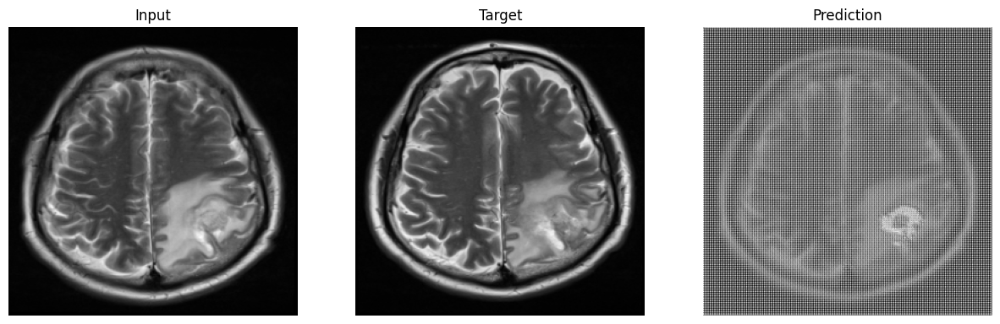

Epoch 2/50
Step 0: Gen Loss = 195.1524, Disc Loss = 0.9067


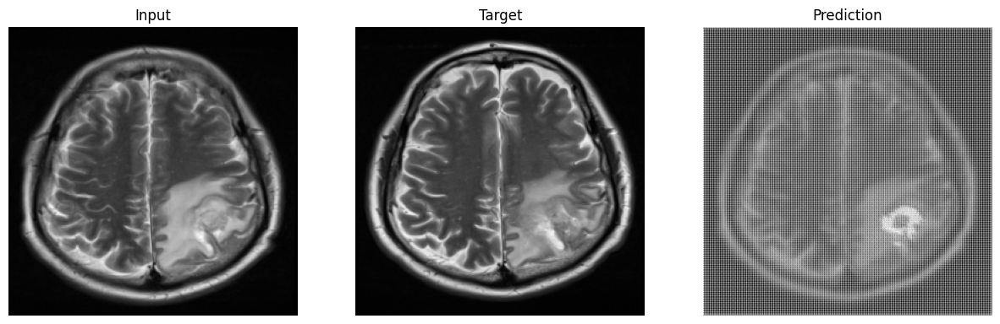

Epoch 3/50
Step 0: Gen Loss = 181.8382, Disc Loss = 0.7044


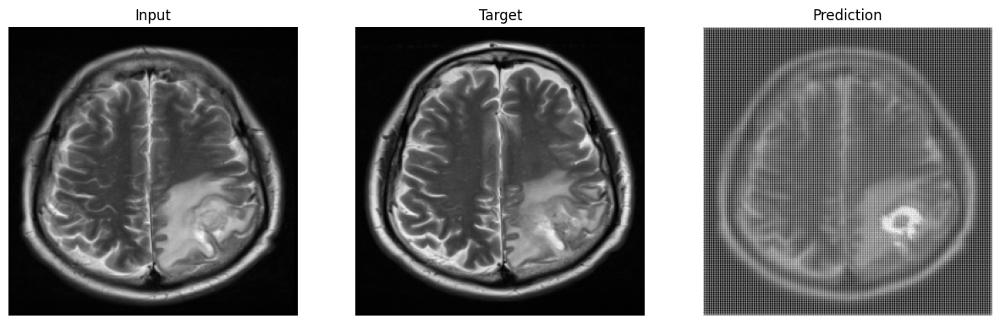

Epoch 4/50
Step 0: Gen Loss = 170.6145, Disc Loss = 0.4360


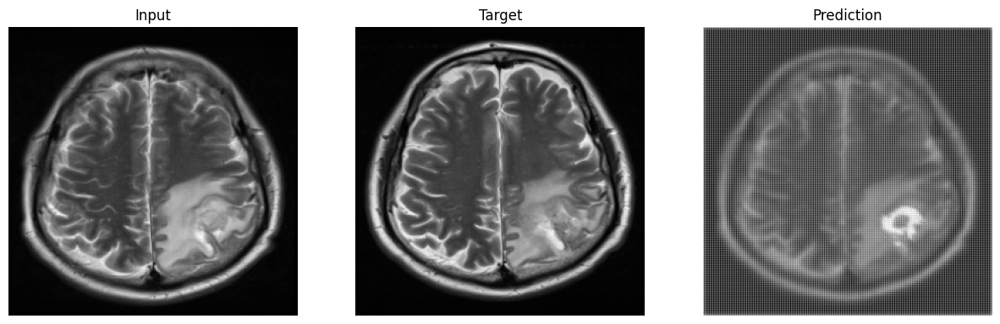

Epoch 5/50
Step 0: Gen Loss = 161.8655, Disc Loss = 0.3173


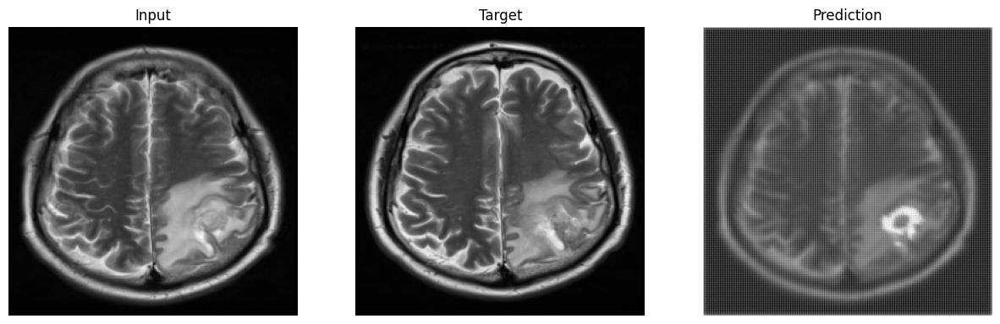

Epoch 6/50
Step 0: Gen Loss = 154.2738, Disc Loss = 0.2267


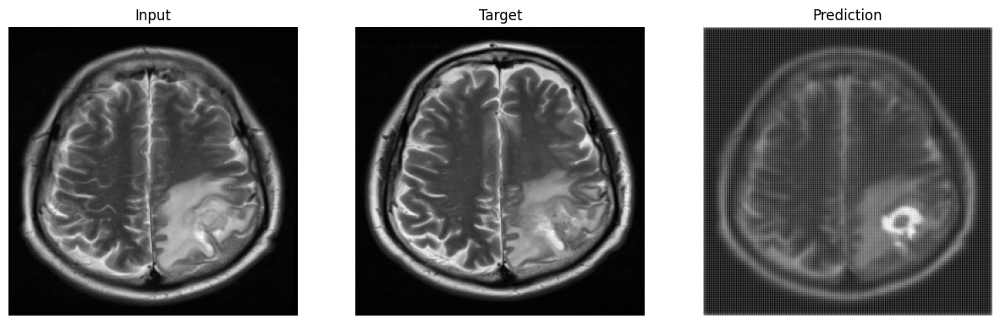

Epoch 7/50
Step 0: Gen Loss = 148.0285, Disc Loss = 0.1747


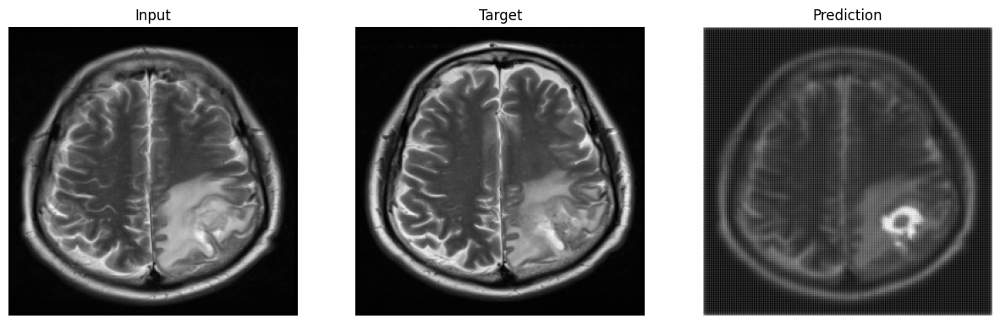

Epoch 8/50
Step 0: Gen Loss = 143.7430, Disc Loss = 0.1734


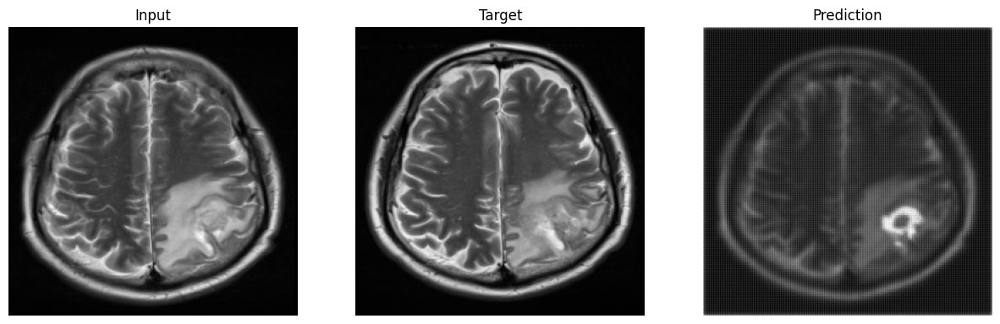

Epoch 9/50
Step 0: Gen Loss = 139.2573, Disc Loss = 0.1144


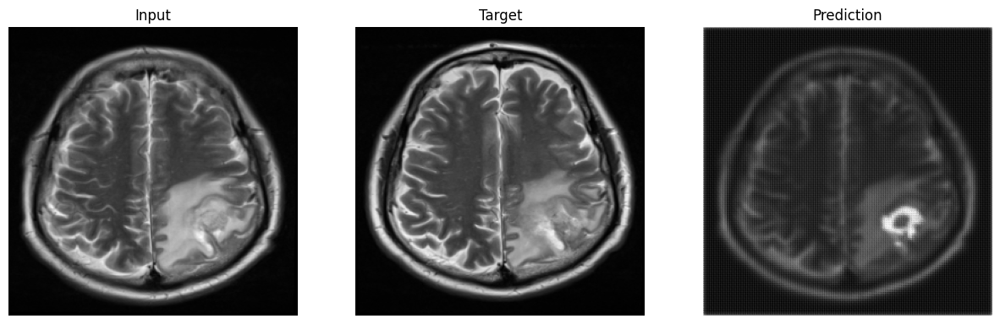

Epoch 10/50
Step 0: Gen Loss = 135.6378, Disc Loss = 0.1137


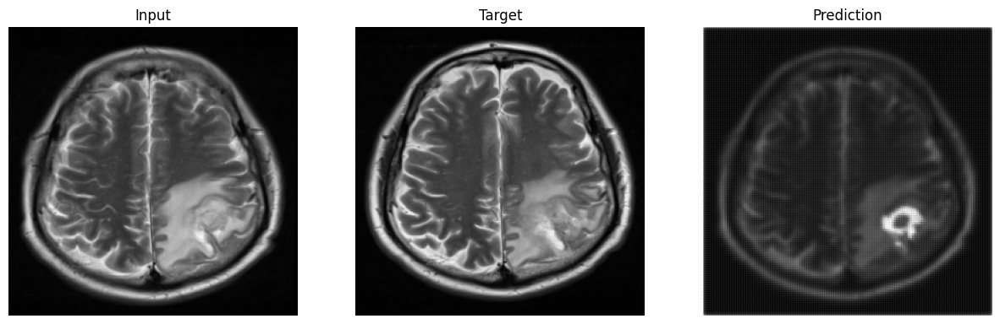

Epoch 11/50
Step 0: Gen Loss = 133.7193, Disc Loss = 0.0788


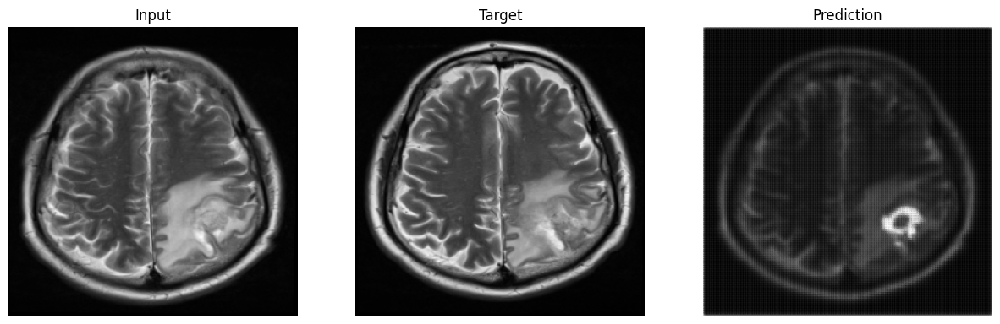

Epoch 12/50
Step 0: Gen Loss = 132.3040, Disc Loss = 0.0673


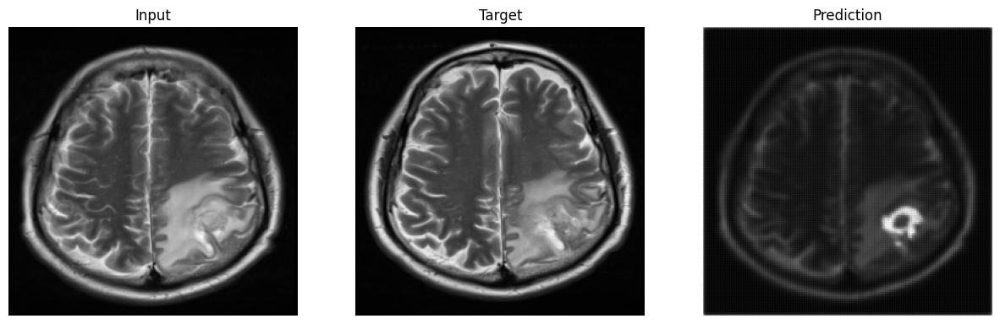

Epoch 13/50
Step 0: Gen Loss = 130.6904, Disc Loss = 0.0526


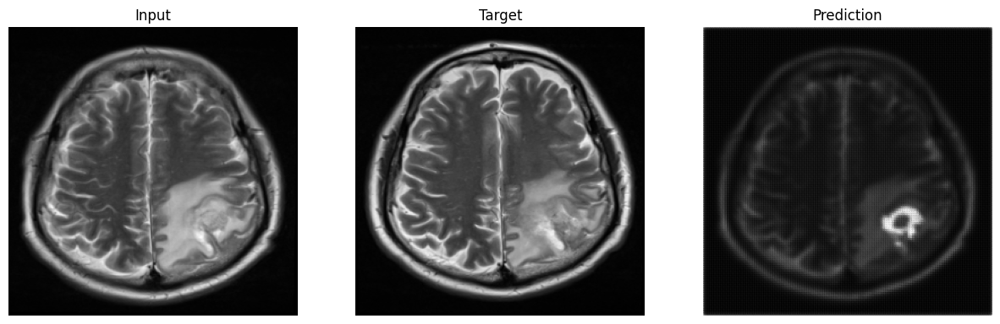

Epoch 14/50
Step 0: Gen Loss = 129.4731, Disc Loss = 0.0467


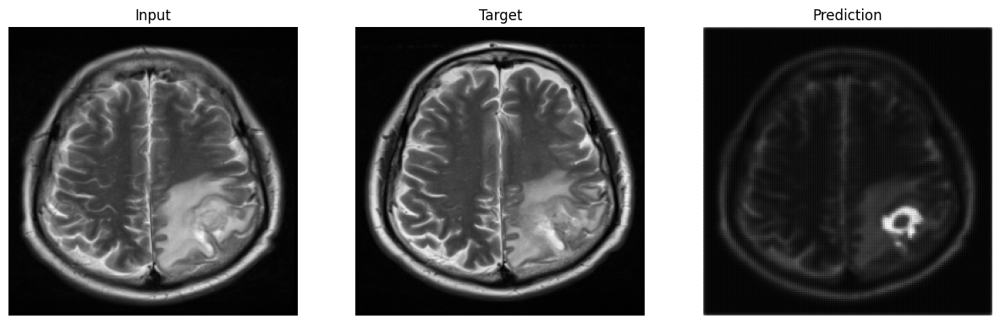

Epoch 15/50
Step 0: Gen Loss = 128.6696, Disc Loss = 0.0445


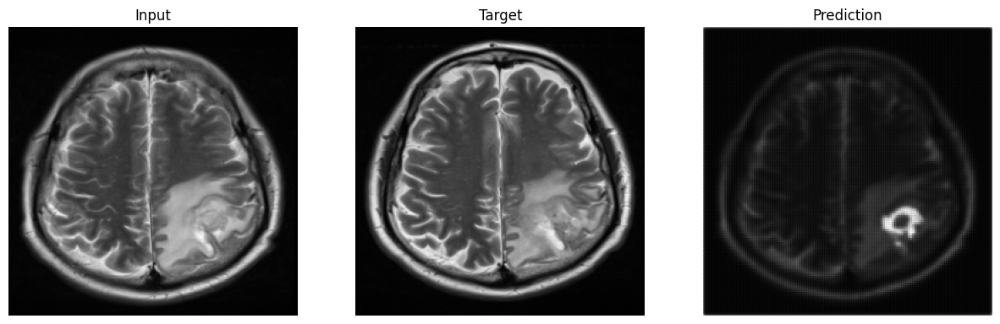

Epoch 16/50
Step 0: Gen Loss = 127.7241, Disc Loss = 0.0377


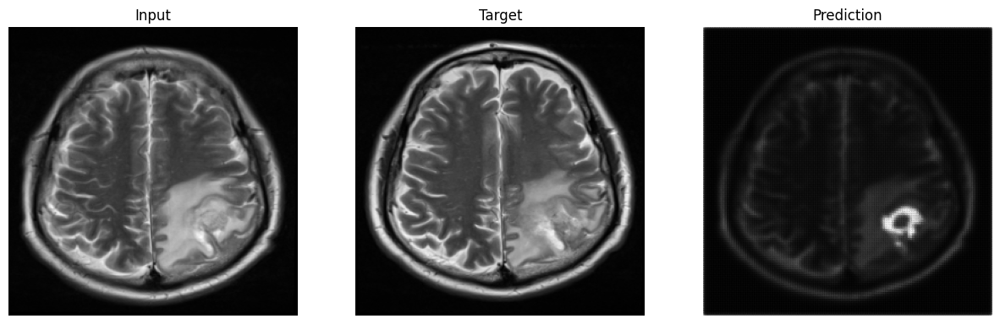

Epoch 17/50
Step 0: Gen Loss = 127.0406, Disc Loss = 0.0348


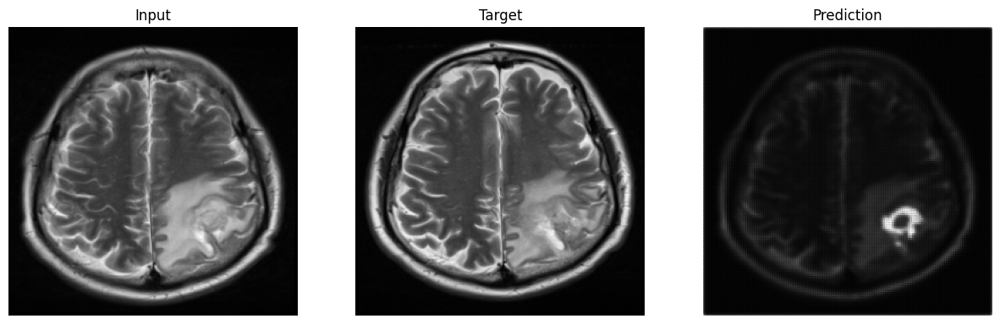

Epoch 18/50
Step 0: Gen Loss = 126.5327, Disc Loss = 0.0297


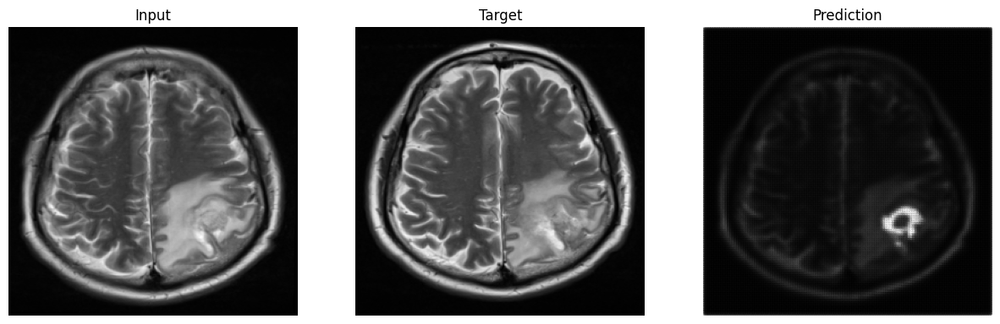

Epoch 19/50
Step 0: Gen Loss = 126.0581, Disc Loss = 0.0252


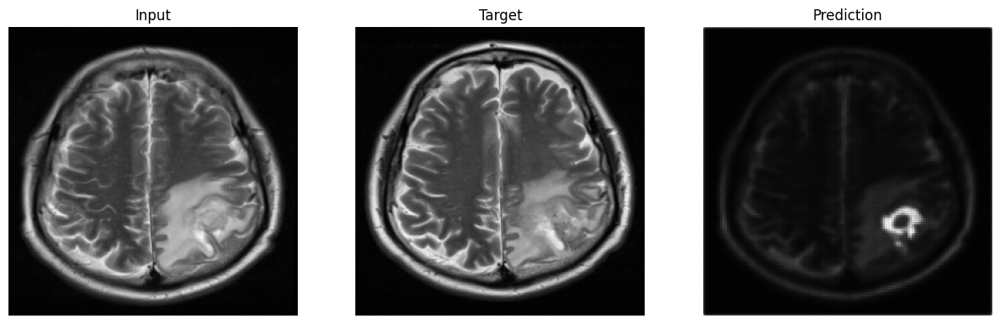

Epoch 20/50
Step 0: Gen Loss = 125.5728, Disc Loss = 0.0243


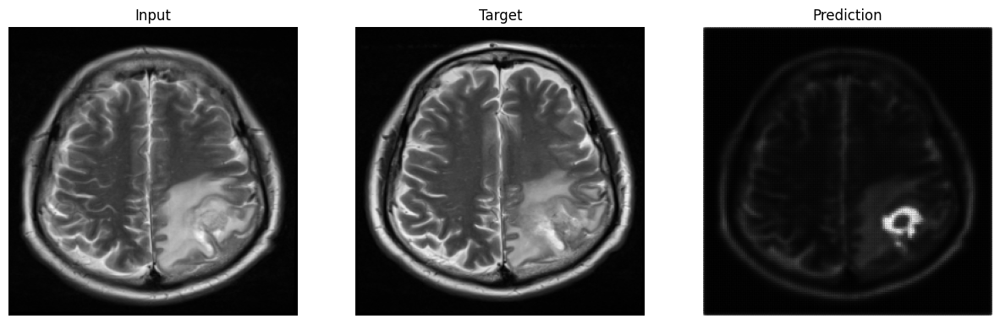

Epoch 21/50
Step 0: Gen Loss = 125.4083, Disc Loss = 0.0213


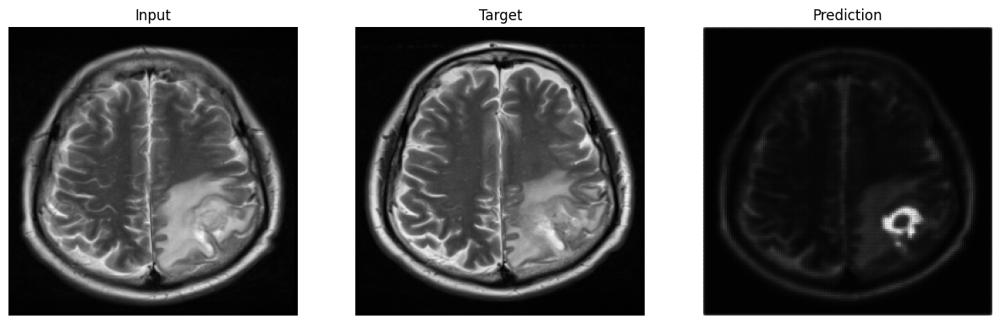

Epoch 22/50
Step 0: Gen Loss = 125.0782, Disc Loss = 0.0198


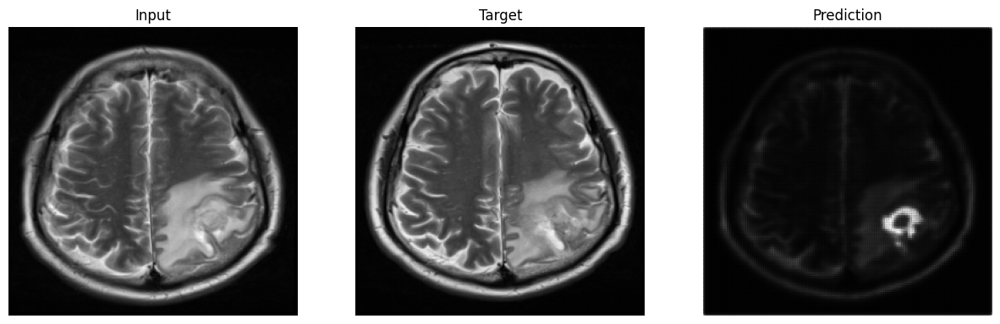

Epoch 23/50
Step 0: Gen Loss = 125.0272, Disc Loss = 0.0179


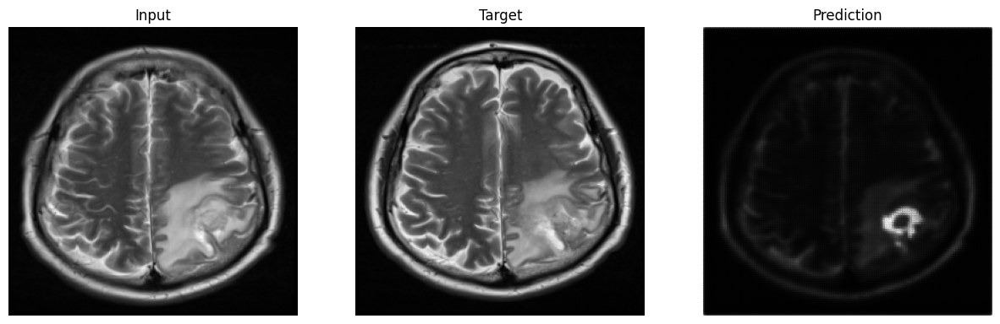

Epoch 24/50
Step 0: Gen Loss = 124.7010, Disc Loss = 0.0149


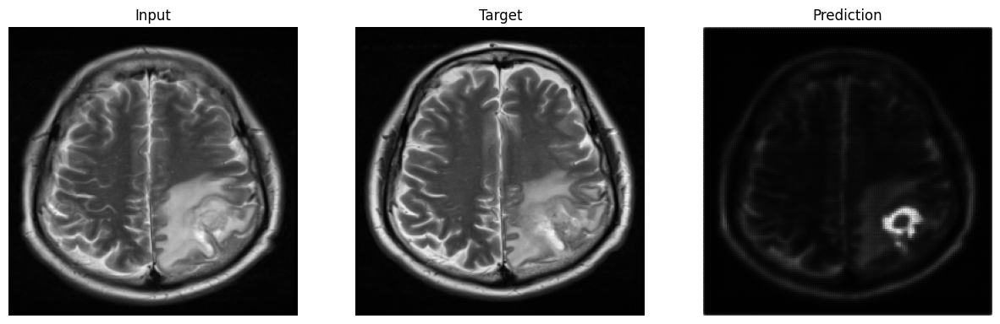

Epoch 25/50
Step 0: Gen Loss = 124.5810, Disc Loss = 0.0157


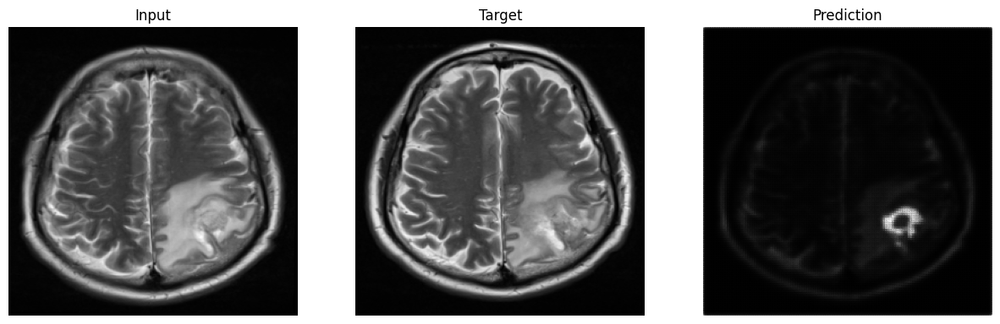

Epoch 26/50
Step 0: Gen Loss = 124.3977, Disc Loss = 0.0153


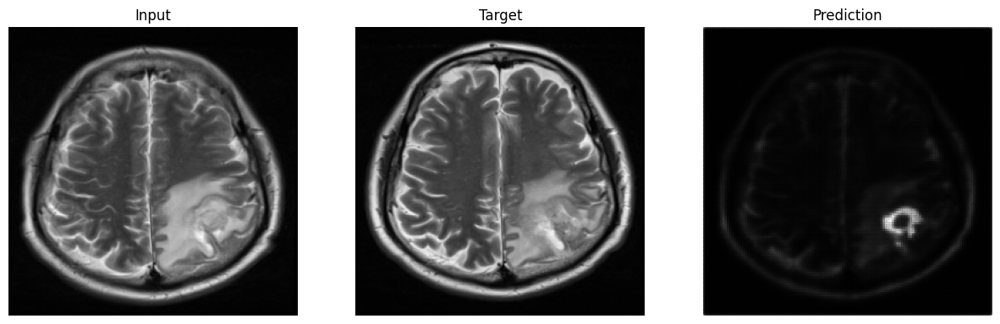

Epoch 27/50
Step 0: Gen Loss = 124.2064, Disc Loss = 0.0136


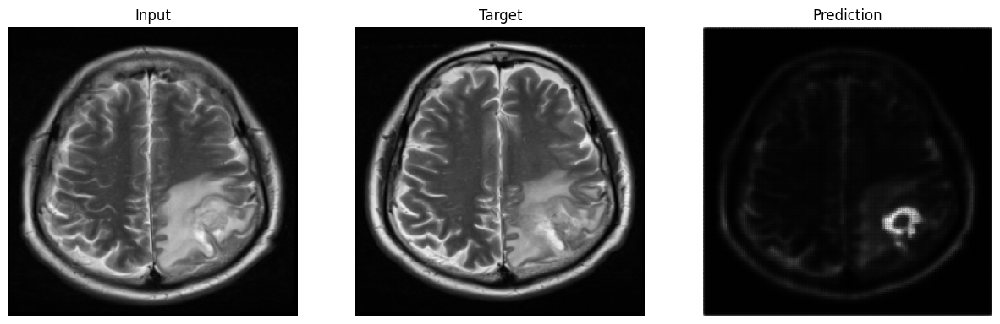

Epoch 28/50
Step 0: Gen Loss = 124.2447, Disc Loss = 0.0123


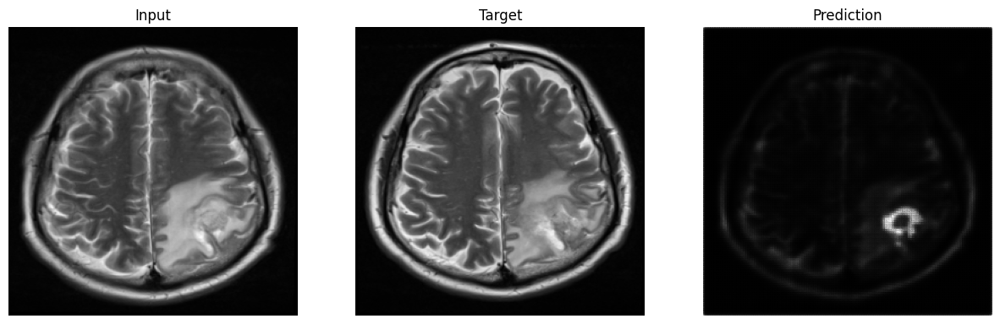

Epoch 29/50
Step 0: Gen Loss = 123.5590, Disc Loss = 0.0103


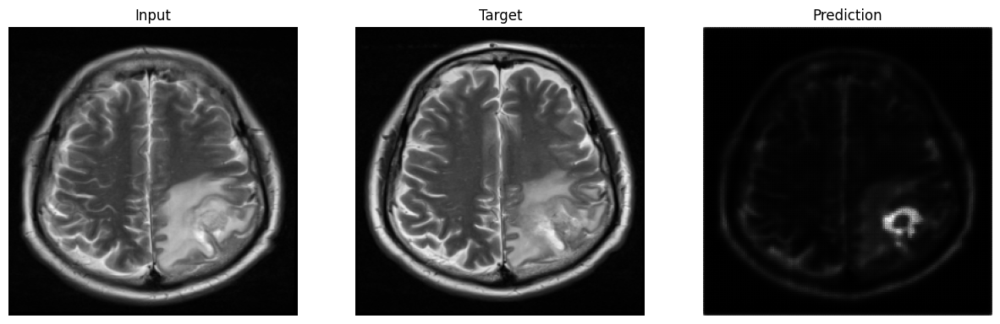

Epoch 30/50
Step 0: Gen Loss = 123.7735, Disc Loss = 0.0108


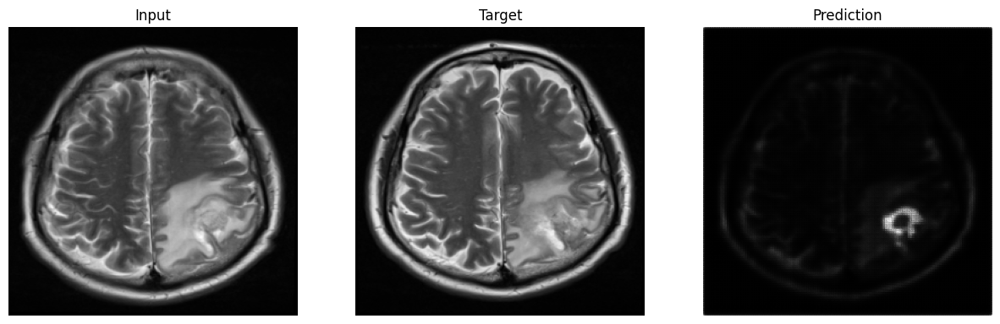

Epoch 31/50
Step 0: Gen Loss = 123.8567, Disc Loss = 0.0103


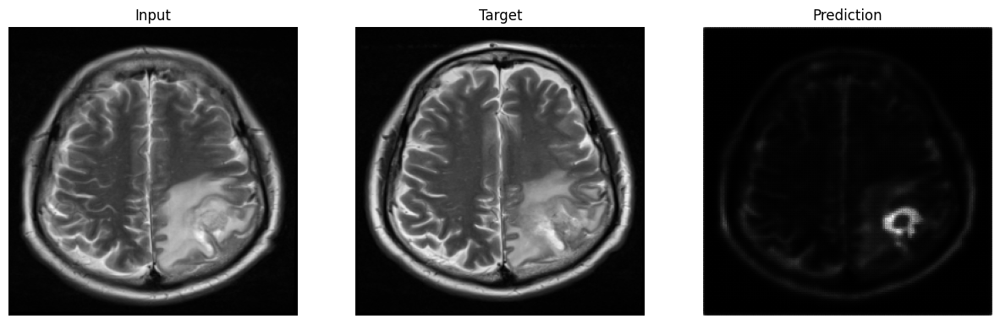

Epoch 32/50
Step 0: Gen Loss = 123.6749, Disc Loss = 0.0095


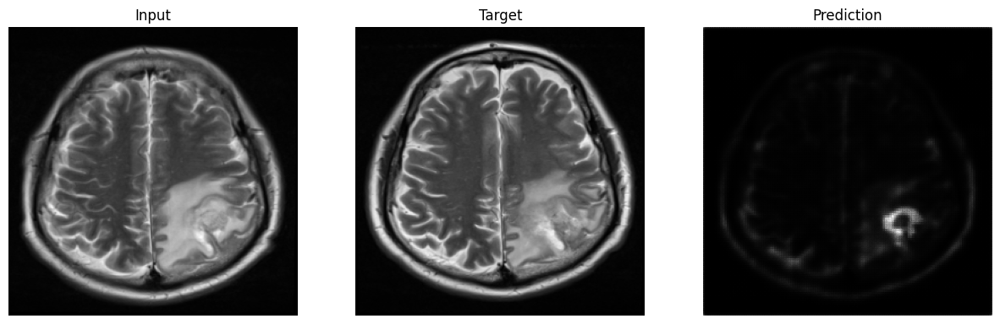

Epoch 33/50
Step 0: Gen Loss = 123.5075, Disc Loss = 0.0079


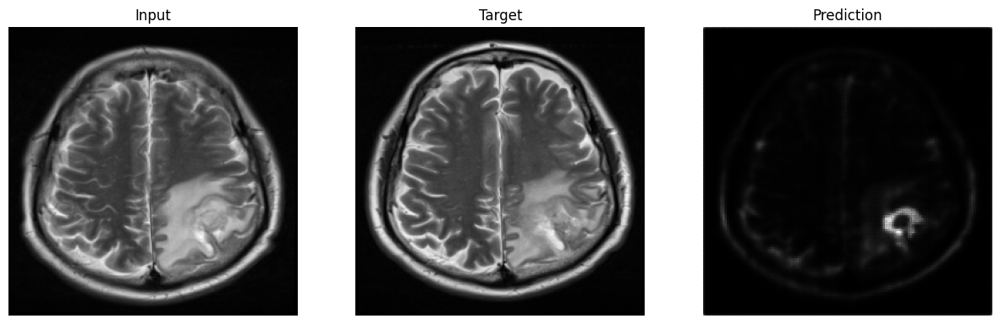

Epoch 34/50
Step 0: Gen Loss = 123.3481, Disc Loss = 0.0076


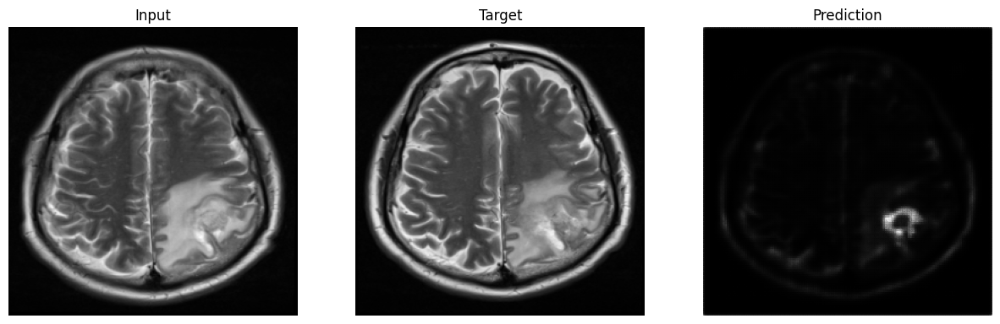

Epoch 35/50
Step 0: Gen Loss = 123.2696, Disc Loss = 0.0081


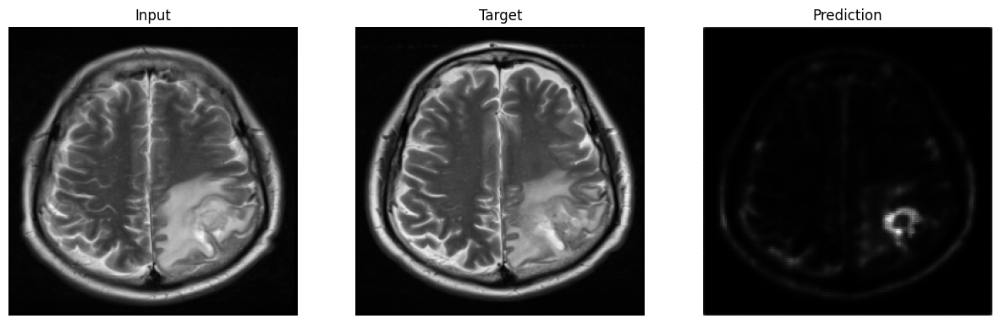

Epoch 36/50
Step 0: Gen Loss = 123.4079, Disc Loss = 0.0074


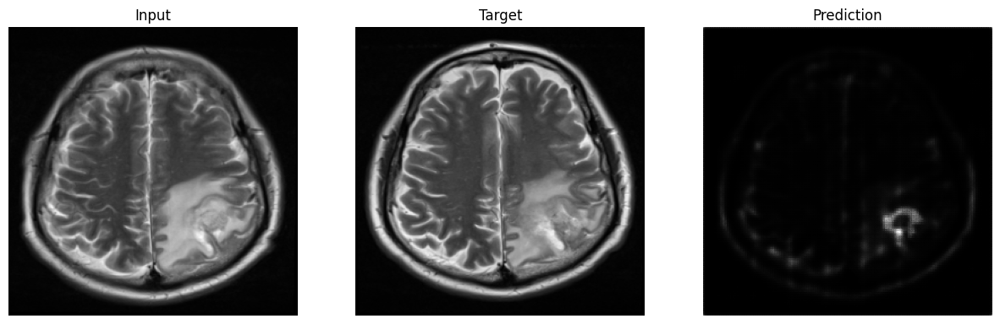

Epoch 37/50
Step 0: Gen Loss = 123.5687, Disc Loss = 0.0061


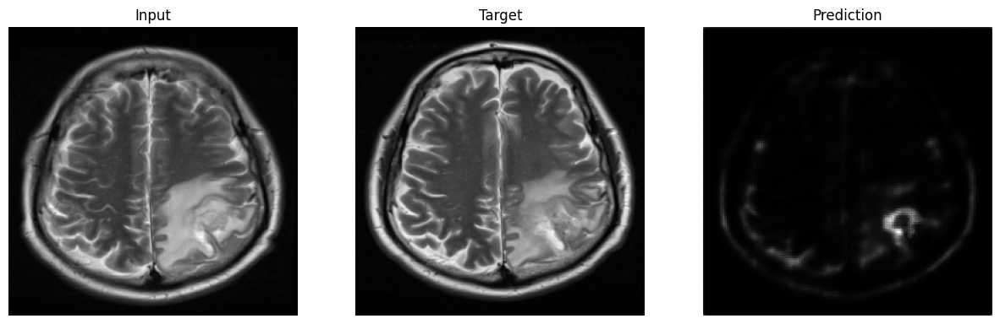

Epoch 38/50
Step 0: Gen Loss = 123.1822, Disc Loss = 0.0055


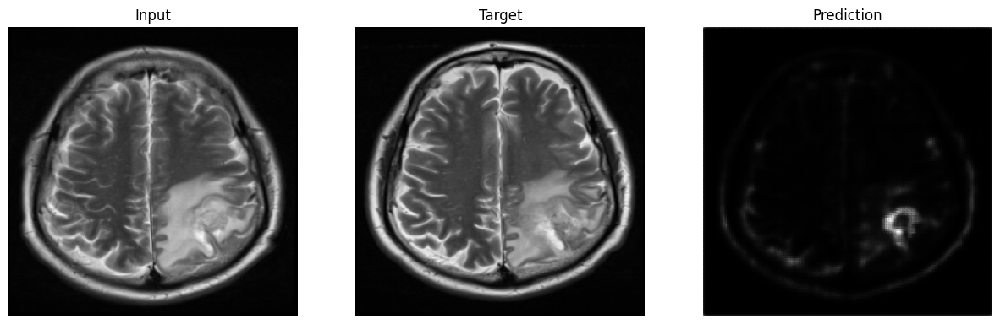

Epoch 39/50
Step 0: Gen Loss = 123.1696, Disc Loss = 0.0062


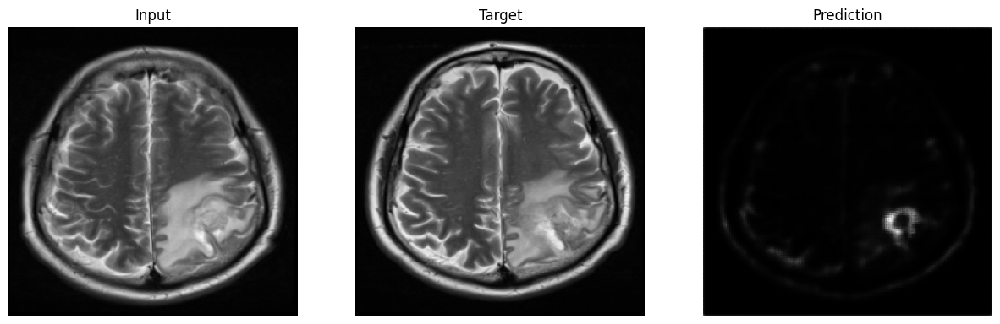

Epoch 40/50
Step 0: Gen Loss = 123.1310, Disc Loss = 0.0057


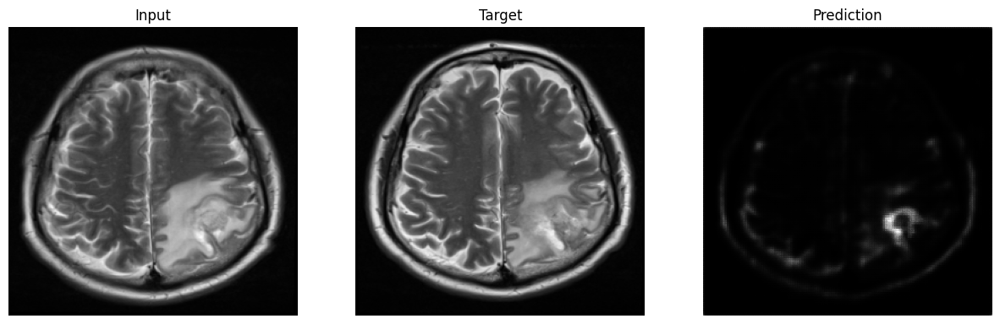

Epoch 41/50
Step 0: Gen Loss = 123.0377, Disc Loss = 0.0049


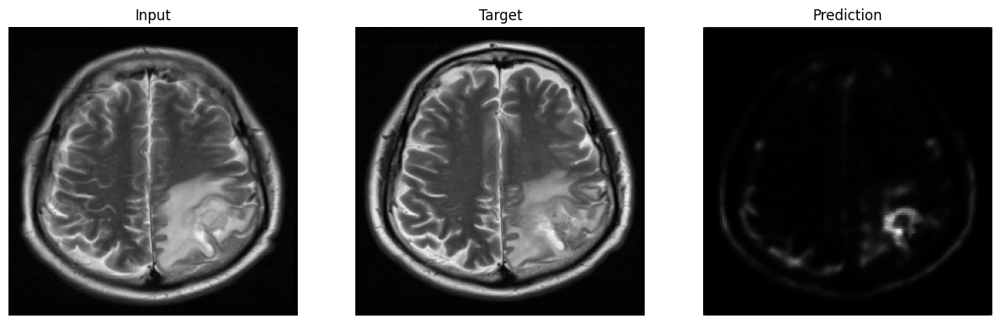

Epoch 42/50
Step 0: Gen Loss = 122.9655, Disc Loss = 0.0048


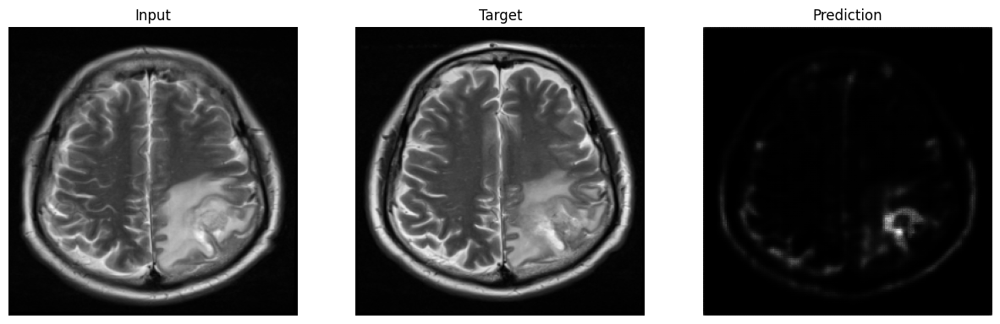

Epoch 43/50
Step 0: Gen Loss = 122.9884, Disc Loss = 0.0047


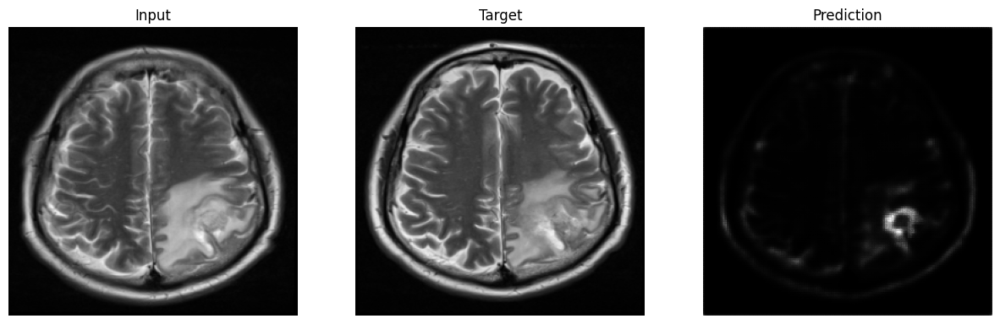

Epoch 44/50
Step 0: Gen Loss = 122.8378, Disc Loss = 0.0047


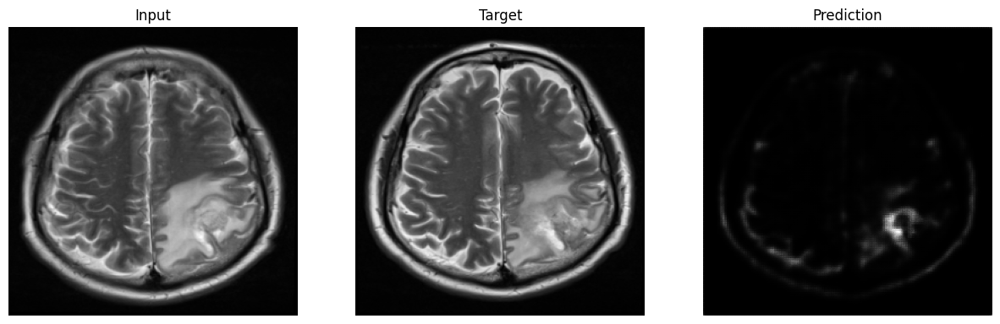

Epoch 45/50
Step 0: Gen Loss = 123.0686, Disc Loss = 0.0039


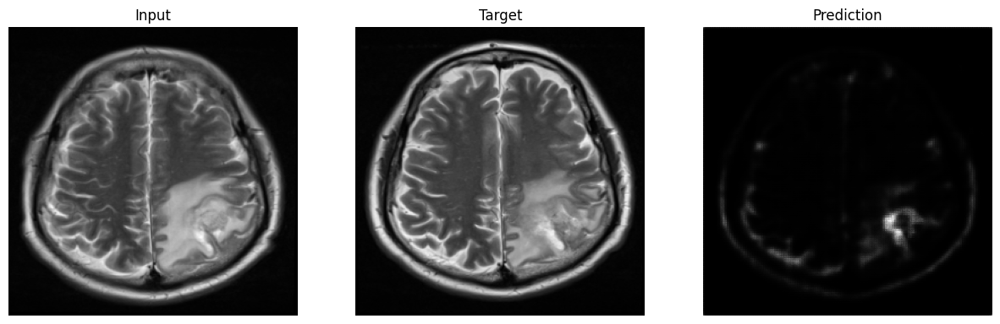

Epoch 46/50
Step 0: Gen Loss = 123.0366, Disc Loss = 0.0038


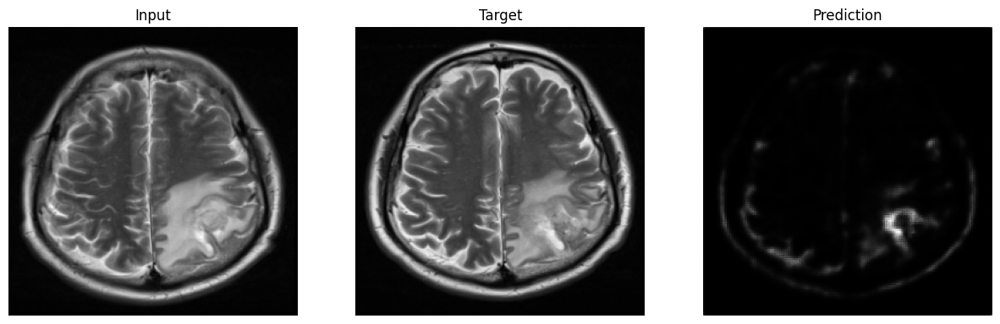

Epoch 47/50
Step 0: Gen Loss = 122.6480, Disc Loss = 0.0039


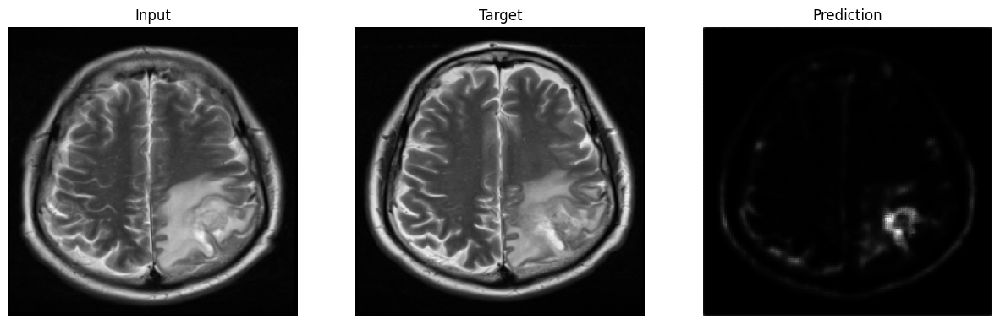

Epoch 48/50
Step 0: Gen Loss = 122.7835, Disc Loss = 0.0039


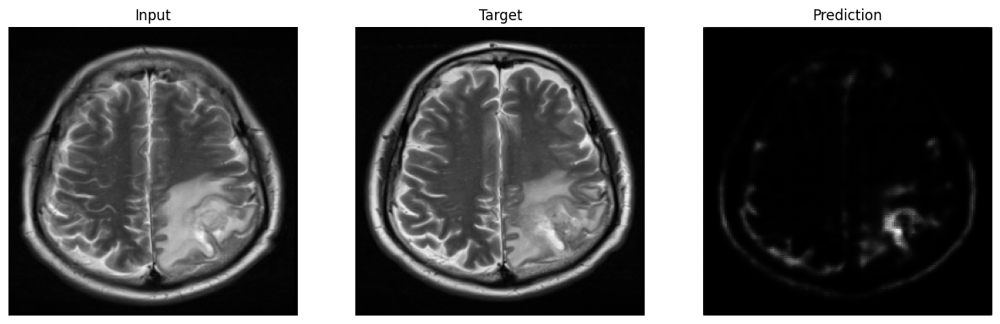

Epoch 49/50
Step 0: Gen Loss = 122.9342, Disc Loss = 0.0031


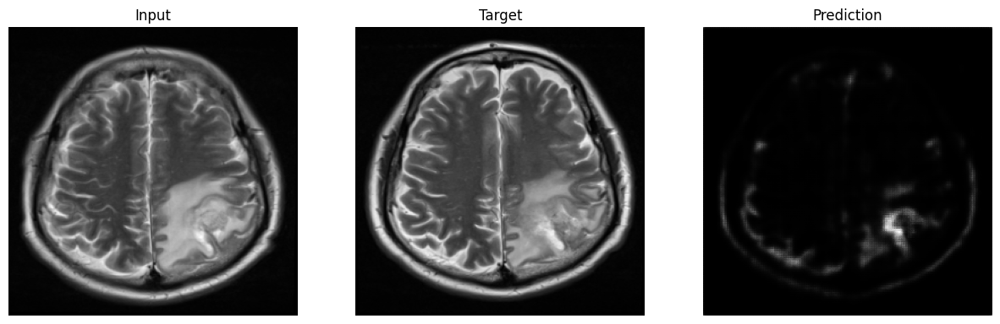

Epoch 50/50
Step 0: Gen Loss = 122.7170, Disc Loss = 0.0031


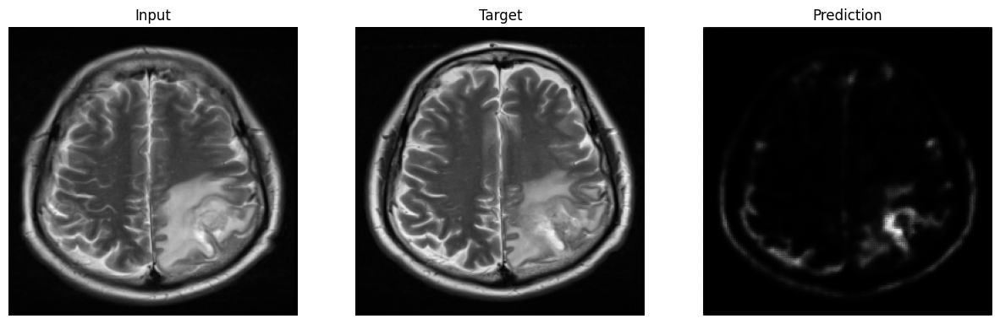

In [ ]:
# 이미지 저장 및 시각화 함수
def generate_and_save_images(model, test_input, target, epoch):
    prediction = model(test_input, training=False)
    plt.figure(figsize=(15, 5))

    # Input, Target, Prediction 나란히 시각화
    display_list = [test_input[0, :, :, 0], target[0, :, :, 0], prediction[0, :, :, 0]]
    title_list = ["Input", "Target", "Prediction"]

    for i, img in enumerate(display_list):
        plt.subplot(1, 3, i+1)
        plt.imshow(img * 0.5 + 0.5, cmap='gray')  # 정규화: -1~1 → 0~1
        plt.title(title_list[i])
        plt.axis('off')

    plt.savefig(f'output_epoch_{epoch+1}.png')
    plt.show()

# 데이터셋 준비 (tf.data API)
def preprocess_data(input_image, target):
    input_image = tf.image.resize(input_image, [256, 256])
    target = tf.image.resize(target, [256, 256])

    # -1 ~ 1 범위로 정규화
    input_image = (input_image * 2) - 1  # 0~1 → -1~1
    target = (target * 2) - 1  # 0~1 → -1~1
    return input_image, target

# t1post_after에 채널 차원 추가
if len(t1post_after.shape) == 3:  # [batch_size, height, width]
    t1post_after = np.expand_dims(t1post_after, axis=-1)  # [batch_size, height, width, 1]

# Dataset 생성
train_dataset = tf.data.Dataset.from_tensor_slices((input_images, t1post_after))
train_dataset = train_dataset.map(preprocess_data).batch(4)

# 데이터 차원 출력 (확인용)
print("Input images shape:", input_images.shape)  # (15, 256, 256, 2)
print("Target images shape:", t1post_after.shape)  # (15, 256, 256, 1)

# 학습 실행
EPOCHS = 50
train(train_dataset, EPOCHS)